KUL H02A5a Computer Vision: Group Assignment 2
---------------------------------------------------------------

<span style="color:red">**TODO**: Add your names below.</span>

<span style="color:red">**TODO**: Change the notebook name by replacing the X with your actual group number.</span>

Student names: <span style="color:red">name1, name2, ...</span>.

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 1* and you start from this template notebook. You can make use of the *Group assignment 2* forum/discussion board on Toledo if you have any questions.

The notebook you submit for grading is the last notebook pinned as default and submitted to the competition prior to the deadline.

Good luck and have fun!

---------------------------------------------------------------
NOTES:
* This notebook is just a template. Please keep the five main sections, but feel free to adjust further in any way you please!
* Clearly indicate the improvements that you make! You can for instance use subsections like: *3.1. Improvement: applying loss function f instead of g*.


# Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook, with a final discussion:
* Image classification (Sect. 1)
* Semantic segmentation (Sect. 2)
* Adversarial attacks (Sect. 3)
* Discussion (Sect. 4)

## Deep learning resources
If you did not yet explore this in *Group assignment 1 (Sect. 2)*, we recommend using the Pytorch or TensorFlow (and/or Keras) library for building deep learning models.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
import numpy as np
import pandas as pd

# Uncomment the one you'll use
#import tensorflow as tf
import torch

from matplotlib import pyplot as plt

## PASCAL VOC 2009
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


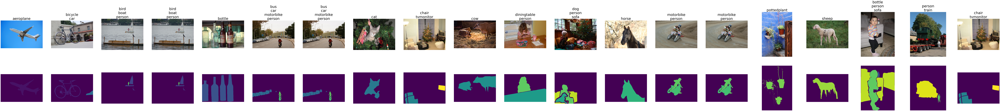

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [2]:
BASE = '/kaggle/input/competitions/kul-computer-vision-ga-2-2026/train'

train_df = pd.read_csv(f'{BASE}/train_set.csv', index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load(f'{BASE}/img/train_{idx}.npy') for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load(f'{BASE}/seg/train_{idx}.npy') for idx, _ in train_df.iterrows()]

print("The training set contains {} examples.".format(len(train_df)))

# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

In [3]:
BASE_TEST = '/kaggle/input/competitions/kul-computer-vision-ga-2-2026/test'

test_df = pd.read_csv(f'{BASE_TEST}/test_set.csv', index_col="Id")
test_df["img"] = [np.load(f'{BASE_TEST}/img/test_{idx}.npy') for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

The test set contains 750 examples.


## Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

# 1. Image classification
The goal here is simple: implement a classification model and train it to recognise all 20 classes (and/or background) using the training set and compete on the test set (by filling in the classification columns in the test dataframe).

In [4]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

In [5]:
class RandomClassificationModel:
    """
    Random classification model: 
        - generates random labels for the inputs based on the class distribution observed during training
        - assumes an input can have multiple labels
    """
    def fit(self, X, y):
        """
        Adjusts the class ratio variable to the one observed in y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        y: list of arrays - n x (nb_classes)

        Returns
        -------
        self
        """
        self.distribution = np.mean(y, axis=0)
        print("Setting class distribution to:\n{}".format("\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        y_pred: list of arrays - n x (nb_classes)
        """
        np.random.seed(0)
        return [np.array([int(np.random.rand() < p) for p in self.distribution]) for _ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomClassificationModel()
model.fit(train_df["img"], train_df[labels])
test_df.loc[:, labels] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
aeroplane: 0.06275033377837116
bicycle: 0.0520694259012016
bird: 0.07343124165554073
boat: 0.06408544726301736
bottle: 0.056074766355140186
bus: 0.050734312416555405
car: 0.08411214953271028
cat: 0.06008010680907877
chair: 0.09212283044058744
cow: 0.04005340453938585
diningtable: 0.06408544726301736
dog: 0.05740987983978638
horse: 0.056074766355140186
motorbike: 0.06275033377837116
person: 0.27636849132176233
pottedplant: 0.05740987983978638
sheep: 0.036048064085447265
sofa: 0.05874499332443257
train: 0.0534045393858478
tvmonitor: 0.06809078771695594


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


# 2. Semantic segmentation
The goal here is to implement a segmentation model that labels every pixel in the image as belonging to one of the 20 classes (and/or background). Use the training set to train your model and compete on the test set (by filling in the segmentation column in the test dataframe).

--manolis start

## Architecture: U-Net

We will use **U-Net** (Ronneberger et al., 2015) trained from scratch with random initialization. The choice is motivated specifically by the constraints of this task:

- **Designed for small datasets without pretraining.** U-Net was originally proposed for biomedical segmentation with very few training images, where ImageNet-pretrained encoders were not applicable. Our training set of 749 images sits in exactly this regime, and the literature consistently identifies U-Net as a strong default for from-scratch segmentation on small datasets.

- **Skip connections preserve spatial detail.** U-Net concatenates encoder feature maps to the decoder at every resolution level, so fine spatial information (object boundaries, thin structures) is not lost through the bottleneck. This matters more when training from scratch, since the encoder cannot rely on rich pretrained low-level features.

- **Fully convolutional.** The architecture contains only convolutions, batch norm, ReLU, pooling, and upsampling, there are no fully-connected layers. This means the network can be trained on 256×256 random crops and applied to test images at their full native resolution at inference time.


In [6]:
##imports cell

import torch
import torch.nn as nn
from torch.utils.data import Dataset
from collections import Counter
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.nn.functional as F
from torch.utils.data import DataLoader
import time
from pathlib import Path
import matplotlib.patches as mpatches
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


## The training dataframe

`train_df` holds the 749 training examples, one per row, indexed by image ID. The first 20 columns are binary indicators (0/1) for each VOC class present in the image (an image can have multiple positive labels). The `img` column contains the RGB image as a `(H, W, 3)` `uint8` array, and the `seg` column contains the segmentation mask as a `(H, W)` `uint8` array of class indices in `[0, 20]` (0 = background, 1–20 = the foreground classes).

In [7]:
# --- 1. Look at the dataframe -------------------------------------------
print(f"Number of training examples: {len(train_df)}")
print(f"Columns (labels + img + seg): {list(train_df.columns)}")
print(f"Class label columns: {list(labels)}")
print(f"Number of class labels: {len(labels)}")
print()
print("First few rows of the label part:")
print(train_df[labels].head())

Number of training examples: 749
Columns (labels + img + seg): ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor', 'img', 'seg']
Class label columns: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
Number of class labels: 20

First few rows of the label part:
    aeroplane  bicycle  bird  boat  bottle  bus  car  cat  chair  cow  \
Id                                                                      
0           0        0     0     0       0    0    0    0      0    1   
1           0        0     0     0       1    0    0    0      0    0   
2           0        0     0     0       1    0    0    0      0    0   
3           0        0     0     0       0    0    0    1      0    0   
4         

In [8]:
# --- 2. Inspect a single example ----------------------------------------
sample_img = train_df["img"].iloc[0]
sample_seg = train_df["seg"].iloc[0]

print("Image array:")
print(f"  shape: {sample_img.shape}")
print(f"  dtype: {sample_img.dtype}")
print(f"  min/max: {sample_img.min()} / {sample_img.max()}")
print()
print("Segmentation mask array:")
print(f"  shape: {sample_seg.shape}")
print(f"  dtype: {sample_seg.dtype}")
print(f"  min/max: {sample_seg.min()} / {sample_seg.max()}")
print(f"  unique values: {np.unique(sample_seg)}")

Image array:
  shape: (333, 500, 3)
  dtype: uint8
  min/max: 0 / 255

Segmentation mask array:
  shape: (333, 500)
  dtype: uint8
  min/max: 0 / 10
  unique values: [ 0 10]


## Checking that the size of the image and the mask is the same

In [9]:
mismatches = []
for idx, row in train_df.iterrows():
    img_h, img_w = row["img"].shape[:2]   # (H, W, 3) -> take H, W
    seg_h, seg_w = row["seg"].shape       # (H, W)
    if (img_h, img_w) != (seg_h, seg_w):
        mismatches.append((idx, row["img"].shape, row["seg"].shape))

print(f"Checked {len(train_df)} examples.")
print(f"Mismatches: {len(mismatches)}")
if mismatches:
    for m in mismatches[:10]:
        print(" ", m)

Checked 749 examples.
Mismatches: 0


Does every image have a mask? Yes, it does.

In [10]:
n_pure_bg = sum(set(np.unique(seg).tolist()) == {0} for seg in train_df["seg"])
print(f"Images with only background pixels: {n_pure_bg}")

Images with only background pixels: 0


## Why we use a fixed crop size
PyTorch requires every image in a batch to have identical spatial dimensions in order to stack them into a single tensor. Since our images come at 146 different resolutions, we crop every training example to a common fixed size.

The crop size must additionally be **divisible by 16**. U-Net downsamples the input four times (each MaxPool halves the spatial dimensions), so the input must be cleanly divisible by 2⁴ = 16; otherwise the encoder's skip connections and the decoder's upsampled features will have mismatched shapes and concatenation will fail.

This is why we first inspect the distribution of image sizes in the dataset — so we can choose a crop size that is large enough to preserve meaningful content, small enough to fit in memory, and divisible by 16.

In [11]:
shape_counter = Counter(arr.shape for arr in train_df["img"])

print(f"Number of unique image shapes: {len(shape_counter)}")
print(f"\nMost common shapes:")
for shape, count in shape_counter.most_common(10):
    print(f"  {shape}: {count} images ({100*count/len(train_df):.1f}%)")

Number of unique image shapes: 146

Most common shapes:
  (375, 500, 3): 303 images (40.5%)
  (333, 500, 3): 111 images (14.8%)
  (500, 375, 3): 56 images (7.5%)
  (500, 333, 3): 24 images (3.2%)
  (332, 500, 3): 21 images (2.8%)
  (334, 500, 3): 15 images (2.0%)
  (500, 334, 3): 10 images (1.3%)
  (335, 500, 3): 8 images (1.1%)
  (400, 500, 3): 7 images (0.9%)
  (500, 500, 3): 7 images (0.9%)


We see that images come in 146 different resolutions, but most cluster around 500 on the long side with the short side near 333–375. Roughly 80% are landscape and 19% portrait. Since they all differ in size, we'll need to crop them to a common shape for batching.

Height — min 112, max 500, median 375, mean 383
Width  — min 257,  max 500,  median 500,  mean 472

Landscape (W>H): 603
Portrait  (H>W): 139
Square    (H=W): 7


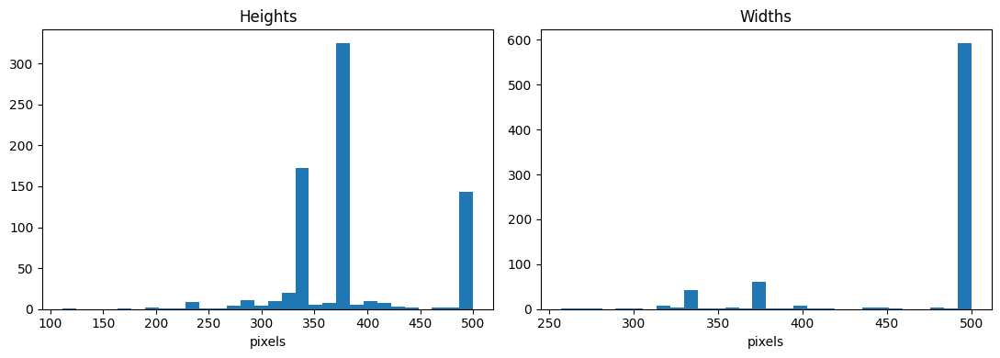

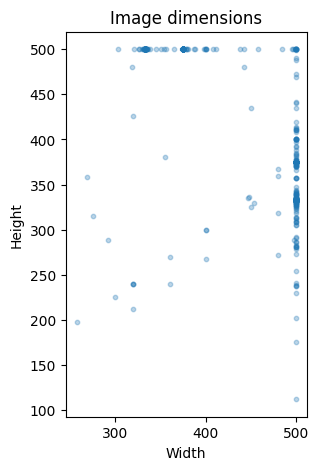

In [12]:
heights = np.array([arr.shape[0] for arr in train_df["img"]])
widths  = np.array([arr.shape[1] for arr in train_df["img"]])

print(f"Height — min {heights.min()}, max {heights.max()}, median {int(np.median(heights))}, mean {heights.mean():.0f}")
print(f"Width  — min {widths.min()},  max {widths.max()},  median {int(np.median(widths))},  mean {widths.mean():.0f}")

n_landscape = int((widths > heights).sum())
n_portrait  = int((heights > widths).sum())
n_square    = int((heights == widths).sum())
print(f"\nLandscape (W>H): {n_landscape}")
print(f"Portrait  (H>W): {n_portrait}")
print(f"Square    (H=W): {n_square}")

fig, ax = plt.subplots(1, 2, figsize=(11, 4))
ax[0].hist(heights, bins=30); ax[0].set_title("Heights"); ax[0].set_xlabel("pixels")
ax[1].hist(widths,  bins=30); ax[1].set_title("Widths");  ax[1].set_xlabel("pixels")
plt.tight_layout(); plt.show()

plt.figure(figsize=(5, 5))
plt.scatter(widths, heights, alpha=0.3, s=10)
plt.xlabel("Width"); plt.ylabel("Height"); plt.title("Image dimensions")
plt.gca().set_aspect("equal"); plt.show()

Images smaller than the chosen crop size will be zero-padded up to that size before cropping. The strong landscape skew (80%) is something we can rely on horizontal flip augmentation to balance.

In [13]:
short_sides = [min(arr.shape[0], arr.shape[1]) for arr in train_df["img"]]
print(f"Min short side: {min(short_sides)}")
print(f"Images with short side < 256: {sum(s < 256 for s in short_sides)}")
print(f"Images with short side < 320: {sum(s < 320 for s in short_sides)}")

Min short side: 112
Images with short side < 256: 16
Images with short side < 320: 49


Most images comfortably exceed 256 on the short side, only 16 (2%) need padding at this crop size, vs 49 (7%) at 320. This is one factor in favour of choosing 256.

We now look at how often each class appears across all training masks. Severe class imbalance is a  big predictor of segmentation failure modes, so it's worth knowing the distribution before we design the loss and choose what to expect from the model.

In [14]:
counter = Counter()
for seg in train_df["seg"]:
    counter.update(seg.flatten().tolist())

total = sum(counter.values())

VOC_CLASSES = [
    "background", "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow", "diningtable", "dog", "horse",
    "motorbike", "person", "pottedplant", "sheep", "sofa", "train", "tvmonitor",
]

print(f"{'value':>5} {'class':<14} {'pixels':>14} {'%':>8}")
print("-" * 45)
for v in sorted(counter.keys()):
    name = VOC_CLASSES[v] if v < len(VOC_CLASSES) else f"<{v}>"
    pct = 100 * counter[v] / total
    print(f"{v:>5} {name:<14} {counter[v]:>14,} {pct:>7.3f}%")

value class                  pixels        %
---------------------------------------------
    0 background        103,837,989  77.742%
    1 aeroplane             897,689   0.672%
    2 bicycle               408,512   0.306%
    3 bird                1,341,794   1.005%
    4 boat                1,038,726   0.778%
    5 bottle              1,060,907   0.794%
    6 bus                 1,918,055   1.436%
    7 car                 1,679,373   1.257%
    8 cat                 2,280,754   1.708%
    9 chair               1,104,030   0.827%
   10 cow                   888,759   0.665%
   11 diningtable         1,898,787   1.422%
   12 dog                   994,808   0.745%
   13 horse               1,080,647   0.809%
   14 motorbike           1,501,660   1.124%
   15 person              5,402,730   4.045%
   16 pottedplant           719,595   0.539%
   17 sheep               1,199,405   0.898%
   18 sofa                1,313,727   0.984%
   19 train               1,617,784   1.211%
   20 tvm

We see that background dominates at 77.7%, so a model that predicts "background everywhere" already gets that pixel accuracy for free, which is why we will use Dice rather than accuracy as our metric. Among foreground classes, person is by far the most common at 4%, while the rarest (bicycle) is at 0.3% — a 250:1 imbalance ratio with background. We expect rare and structurally thin classes (bicycle, pottedplant, aeroplane) to be the hardest for the model to learn.

## Summary of Dataset characterization 

The training set has **749 examples**. This is small and drives several decisions: model capacity, augmentation strength, and expected overfitting risk.

**Image format.** RGB `uint8` arrays in [0, 255], variable resolutions (146 unique shapes), 80% landscape and 19% portrait, long side almost always 500 pixels.

**Mask format.** Single-channel 2D `uint8` arrays with the same H×W as the image. Pixel values are class indices in [0, 20] (0 = background, 1–20 = VOC foreground classes).

**Crop size.** We use **256×256** random crops during training: divisible by 16 (required for U-Net's four downsampling steps), fits inside 98% of images natively, and supports a healthy batch size on a single GPU.

**Class imbalance.** Background dominates at 77.7% of all pixels; person is the most common foreground class at 4.0%; all others lie between 0.3% and 1.7%. The imbalance ratio between background and the rarest class (bicycle) is roughly 250:1. We expect rare and thin-structured classes to be the hardest for the model to segment, and we mirror the competition's Dice metric internally rather than relying on pixel accuracy.

We hold out 20% of the training set (149 examples) for validation, using a fixed random seed (42) for reproducibility.

In [15]:
SEED = 42
rng = np.random.default_rng(SEED)

n = len(train_df)
indices = rng.permutation(n)
n_val = int(0.2 * n)
val_indices   = sorted(indices[:n_val].tolist())
train_indices = sorted(indices[n_val:].tolist())

We verify that the random 80/20 split happens to cover every class in both subsets. With 21 classes and only 149 validation images, a particularly unlucky split could leave a rare class out of the validation set, which would make its per-class Dice meaningless. The check confirms all 21 classes are represented in both train and val, so we keep this split.

In [16]:
def classes_present(seg_arrays):
    """Return set of class indices that appear at least once across the given masks."""
    seen = set()
    for seg in seg_arrays:
        seen.update(np.unique(seg).tolist())
    return seen

train_classes = classes_present(train_df["seg"].iloc[train_indices])
val_classes   = classes_present(train_df["seg"].iloc[val_indices])

print(f"Classes in train: {sorted(train_classes)}")
print(f"Classes in val:   {sorted(val_classes)}")
print(f"Missing from val: {sorted(train_classes - val_classes)}")

Classes in train: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
Classes in val:   [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
Missing from val: []


## Training augmentation pipeline

We apply the following augmentations to each training example, in order, every time it's drawn from the dataset:

- **PadIfNeeded → RandomScale → PadIfNeeded** scales each image randomly between 0.8× and 1.5× of its size, padding before and after to ensure the result is at least 256×256. This teaches the model some scale invariance because objects can appear at different sizes in the test images.
- **CropNonEmptyMaskIfExists** then **RandomCrop** as fallback: the first tries to crop a 256×256 region containing at least one foreground pixel (used 80% of the time), and the second is a plain random crop. We added this after observing that pure random cropping occasionally lands on background-only regions of images with small objects, wasting training signal.
- **HorizontalFlip** mirrors the image left-right with 50% probability. The dataset is 80% landscape and the model has no reason to be left/right biased, so this roughly doubles the effective dataset size for free.
- **ColorJitter** randomly perturbs brightness, contrast, saturation and hue. Encourages invariance to lighting conditions.
- **Normalize** subtracts a channel-wise mean and divides by a channel-wise standard deviation, both computed on our training subset. This brings inputs to roughly zero mean and unit variance per channel, which helps optimization converge faster.
- **ToTensorV2** converts NumPy arrays to PyTorch tensors with channel-first layout.

The same geometric transform is applied to both image and mask, which is why we use Albumentations rather than torchvision — Albumentations supports joint image+mask augmentation out of the box.

With only 749 training images, augmentation is the main defence against overfitting: each epoch the model sees a different crop, possibly flipped, possibly differently coloured, of every image, so the effective training set is much larger than 749 fixed examples.

In [17]:

# Channel-wise sums on the training set 
sum_per_channel = np.zeros(3, dtype=np.float64)
sq_per_channel  = np.zeros(3, dtype=np.float64)
n_pixels = 0

for idx in train_indices:
    img = train_df["img"].iloc[idx].astype(np.float32) / 255.0   # (H, W, 3) in [0, 1]
    h, w, _ = img.shape
    sum_per_channel += img.reshape(-1, 3).sum(axis=0)
    sq_per_channel  += (img.reshape(-1, 3) ** 2).sum(axis=0)
    n_pixels += h * w

mean = sum_per_channel / n_pixels
std  = np.sqrt(sq_per_channel / n_pixels - mean ** 2)

print(f"Number of pixels:    {n_pixels:,}")
print(f"Train set mean:      [{mean[0]:.4f}, {mean[1]:.4f}, {mean[2]:.4f}]")
print(f"Train set std:       [{std[0]:.4f}, {std[1]:.4f}, {std[2]:.4f}]")

Number of pixels:    106,573,838
Train set mean:      [0.4503, 0.4374, 0.4019]
Train set std:       [0.2692, 0.2659, 0.2817]


In [18]:

CROP_SIZE = 256

train_transform = A.Compose([
      A.PadIfNeeded(min_height=CROP_SIZE, min_width=CROP_SIZE, border_mode=0, fill=0, fill_mask=0),
      A.RandomScale(scale_limit=(-0.2, 0.5), p=1.0),     # 0.8x – 1.5x
      A.PadIfNeeded(min_height=CROP_SIZE, min_width=CROP_SIZE, border_mode=0, fill=0, fill_mask=0),
      A.CropNonEmptyMaskIfExists(height=CROP_SIZE, width=CROP_SIZE, p=0.8),  # foreground crop 80% of the time
      A.RandomCrop(height=CROP_SIZE, width=CROP_SIZE, p=1.0),                # fallback
      A.HorizontalFlip(p=0.5),
      A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05, p=0.5),
      A.Normalize(mean=(0.4503, 0.4374, 0.4019), std=(0.2692, 0.2659, 0.2817)),
      ToTensorV2(),
  ])

In [19]:

class VOCSegDataset(Dataset):
    def __init__(self, df, indices, transform):
        """
        df: the train_df with "img" and "seg" columns
        indices: which rows of df to use (train or val)
        transform: an Albumentations Compose pipeline
        """
        self.df = df
        self.indices = list(indices)
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, i):
        row_idx = self.indices[i]
        img = self.df["img"].iloc[row_idx]   # (H, W, 3) uint8
        seg = self.df["seg"].iloc[row_idx]   # (H, W)    uint8

        out = self.transform(image=img, mask=seg)
        image_tensor = out["image"]                # float32, (3, H, W), normalized
        mask_tensor  = out["mask"].long()          # int64,   (H, W), class indices

        return image_tensor, mask_tensor

In [20]:
BATCH_SIZE = 16
NUM_WORKERS = 2  

train_dataset = VOCSegDataset(train_df, train_indices, train_transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True, drop_last=True)


 "random cropping occasionally produces all-background crops, which contribute no foreground learning signal. A more sophisticated sampling strategy (e.g. ensuring at least one foreground pixel per crop) could mitigate this."

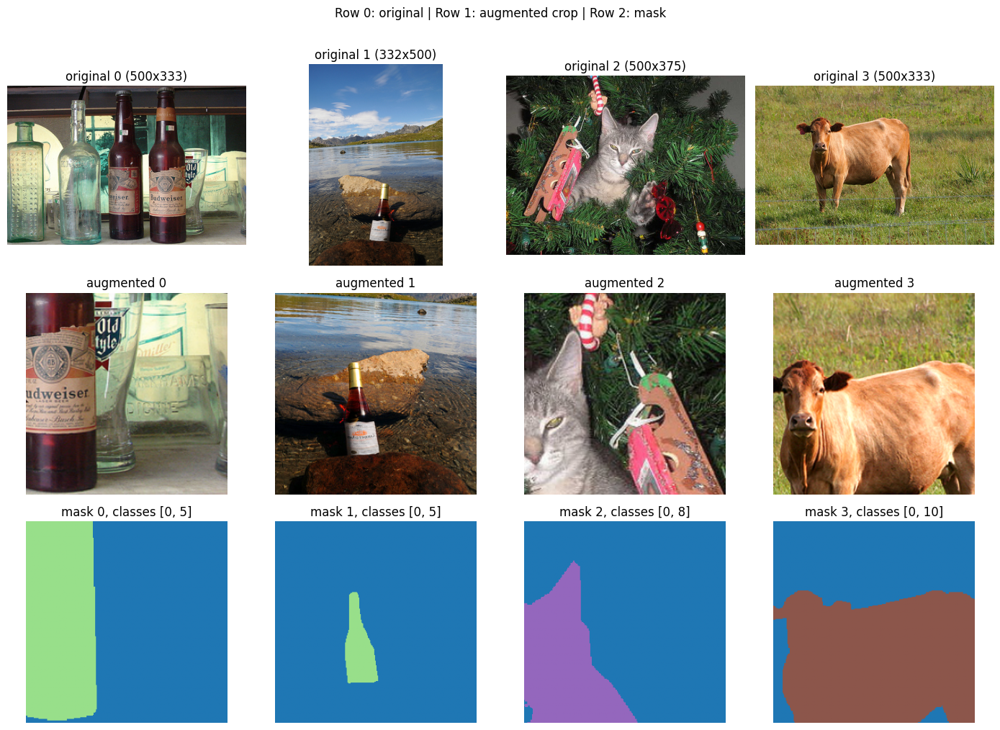

In [21]:
fig, axes = plt.subplots(3, 4, figsize=(14, 10))

mean = torch.tensor(mean).view(3, 1, 1)
std  = torch.tensor(std).view(3, 1, 1)

for j in range(4):
    # Get augmented image + mask directly from dataset (same index each time)
    img_tensor, mask_tensor = train_dataset[j]
    
    # Get corresponding original image
    orig_img = train_df["img"].iloc[train_indices[j]]

    # Row 0: original
    axes[0, j].imshow(orig_img)
    axes[0, j].set_title(f"original {j} ({orig_img.shape[1]}x{orig_img.shape[0]})")
    axes[0, j].axis("off")

    # Row 1: augmented (un-normalize for display)
    img_disp = (img_tensor * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()
    axes[1, j].imshow(img_disp)
    axes[1, j].set_title(f"augmented {j}")
    axes[1, j].axis("off")

    # Row 2: mask
    axes[2, j].imshow(mask_tensor.numpy(), vmin=0, vmax=20, cmap="tab20")
    axes[2, j].set_title(f"mask {j}, classes {sorted(torch.unique(mask_tensor).tolist())}")
    axes[2, j].axis("off")

plt.suptitle("Row 0: original | Row 1: augmented crop | Row 2: mask", y=1.01)
plt.tight_layout()
plt.show()

## UNET Implementation 

Double Convolution Block

In [22]:
class DoubleConv(nn.Module):
    """Two consecutive (Conv 3x3 -> BatchNorm -> ReLU) layers."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)

Downsampling block

In [23]:
class Down(nn.Module):
    """Downsampling step: max pool 2x, then DoubleConv."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x):
        x = self.pool(x)
        x = self.conv(x)
        return x

Upsampling Block

In [24]:
class Up(nn.Module):
    """Upsampling step: upsample 2x, concatenate skip, then DoubleConv."""
    def __init__(self, in_channels, skip_channels, out_channels):
        super().__init__()
        # Upsample halves the channels and doubles the spatial size
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2,
                                     kernel_size=2, stride=2)
        # After concatenation: (in_channels // 2) + skip_channels feature maps
        self.conv = DoubleConv(in_channels // 2 + skip_channels, out_channels)

    def forward(self, x, skip):
        x = self.up(x)
        x = torch.cat([skip, x], dim=1)   # concatenate along channel axis
        x = self.conv(x)
        return x

In [25]:
class UNet(nn.Module):
    """U-Net for semantic segmentation, half-width variant.
    
    Input:  (B, in_channels, H, W) — RGB image, H and W divisible by 16
    Output: (B, num_classes, H, W) — per-pixel class logits
    """
    def __init__(self, in_channels=3, num_classes=21, base_channels=32):
        super().__init__()
        c = base_channels  # 32 for half-width, 64 for full-width

        # Encoder: enc1 keeps spatial size, then 4 Down blocks halve it each
        self.enc1 = DoubleConv(in_channels, c)        # (B, 32, 256, 256)
        self.enc2 = Down(c,      c * 2)               # (B, 64, 128, 128)
        self.enc3 = Down(c * 2,  c * 4)               # (B, 128, 64, 64)
        self.enc4 = Down(c * 4,  c * 8)               # (B, 256, 32, 32)

        # Bottleneck: deepest level, smallest spatial size, most channels
        self.bottleneck = Down(c * 8, c * 16)         # (B, 512, 16, 16)

        # Decoder: 4 Up blocks, each upsamples and merges its matching skip
        self.dec4 = Up(c * 16, c * 8, c * 8)          # (B, 256, 32, 32)
        self.dec3 = Up(c * 8,  c * 4, c * 4)          # (B, 128, 64, 64)
        self.dec2 = Up(c * 4,  c * 2, c * 2)          # (B, 64,  128, 128)
        self.dec1 = Up(c * 2,  c,     c)              # (B, 32,  256, 256)

        # Final 1x1 conv: project 32 channels to 21 class logits
        self.head = nn.Conv2d(c, num_classes, kernel_size=1)

    def forward(self, x):
        # Encoder path: save each output for use as a skip connection
        s1 = self.enc1(x)         # (B, 32, 256, 256)
        s2 = self.enc2(s1)        # (B, 64, 128, 128)
        s3 = self.enc3(s2)        # (B, 128, 64, 64)
        s4 = self.enc4(s3)        # (B, 256, 32, 32)

        # Bottleneck
        b = self.bottleneck(s4)   # (B, 512, 16, 16)

        # Decoder path: each Up block consumes the deeper feature + matching skip
        d4 = self.dec4(b,  s4)    # (B, 256, 32, 32)
        d3 = self.dec3(d4, s3)    # (B, 128, 64, 64)
        d2 = self.dec2(d3, s2)    # (B, 64,  128, 128)
        d1 = self.dec1(d2, s1)    # (B, 32,  256, 256)

        return self.head(d1)      # (B, 21, 256, 256)

## Loss function

We train with a combined loss: per-pixel cross-entropy plus a Dice loss on the foreground classes.

**Cross-entropy** measures how confident the model is in the correct class at each pixel, treating each pixel as an independent classification. It produces a strong, stable gradient even at random initialization, which is essential to get training off the ground.

**Dice loss** measures region overlap between the predicted and true regions of each class, computed as `1 - (2·|A∩B| / (|A|+|B|))`. It is the soft form of the Dice score we use for evaluation, so it directly aligns the training objective with the metric we're judged on. Unlike cross-entropy, Dice resists the "predict the dominant class everywhere" failure mode common on imbalanced data.

We make two design choices in our Dice term:

- **Average only over classes that appear in the current batch.** If a class has no ground-truth pixels in the batch, its Dice is undefined (numerically near-zero from smoothing). Including these absent classes in the mean would heavily penalize the model for "failing" to predict classes that aren't there, which is incorrect. We discovered this experimentally, a one-batch overfit test plateaued at 0.72 instead of approaching 0 until we added this fix.
- **Exclude background from the Dice average.** Background dominates 78% of pixels and is easy to segment, so its Dice score is typically ~0.85 even for a poor model. Including it inflates the metric and reduces the loss signal pushing improvements on foreground classes. Cross-entropy still attends to background normally, so we don't lose the supervision.

Combining the two losses with equal weight gives us the best of both: cross-entropy provides a stable per-pixel learning signal early in training, and Dice nudges predictions toward overlap-correct foreground regions throughout. This is the standard recipe in modern segmentation pipelines.

In [26]:
class DiceLoss(nn.Module):
    def __init__(self, num_classes=21, smooth=1.0, ignore_background=True):
        super().__init__()
        self.num_classes = num_classes
        self.smooth = smooth
        self.ignore_background = ignore_background

    def forward(self, logits, targets):
        probs = F.softmax(logits, dim=1)
        targets_oh = F.one_hot(targets, self.num_classes).permute(0, 3, 1, 2).float()

        dims = (0, 2, 3)
        inter = (probs * targets_oh).sum(dims)
        target_sum = targets_oh.sum(dims)
        pred_sum = probs.sum(dims)

        dice = (2 * inter + self.smooth) / (pred_sum + target_sum + self.smooth)

        present = target_sum > 0  # which classes appear in this batch
        if self.ignore_background:
            dice = dice[1:]
            present = present[1:]

        if present.any():
            # Average ONLY over present classes to avoid skewing loss by absent classes
            return 1.0 - dice[present].mean()
            
        return logits.sum() * 0.0  # safety: no foreground in batch
class CEDiceLoss(nn.Module):
    def __init__(self, num_classes=21, ce_weight=1.0, dice_weight=1.0):
        super().__init__()
        self.ce = nn.CrossEntropyLoss()
        self.dice = DiceLoss(num_classes, ignore_background=True)
        self.ce_w, self.dc_w = ce_weight, dice_weight

    def forward(self, logits, targets):
        return self.ce_w * self.ce(logits, targets) + self.dc_w * self.dice(logits, targets)


## Evaluation metrics

We accumulate a confusion matrix across all validation batches and compute per-class Dice and mean Dice from it at the end of each epoch. Using the matrix as an intermediate gives us per-class Dice, mean Dice, and confusion patterns from a single source.

**Background is included** in the metric, even though it was excluded from the Dice loss. The loss excludes it to focus gradient on hard foreground classes; the metric includes it to reflect overall segmentation quality and stay comparable to the competition score.

**Average only over classes that appear in the validation set.** Classes with zero ground-truth pixels have undefined Dice and would otherwise unfairly drag the mean down.

In [27]:
class SegmentationMetrics:
    """Accumulates per-class confusion + Dice across multiple batches."""
    def __init__(self, num_classes=21):
        self.num_classes = num_classes
        self.reset()

    def reset(self):
        # Confusion matrix: rows are true classes, cols are predicted classes
        self.confusion = torch.zeros(self.num_classes, self.num_classes, dtype=torch.long)

    @torch.no_grad()
    def update(self, logits, targets):
        """Accumulate counts from one batch."""
        # logits: (B, C, H, W), targets: (B, H, W)
        preds = logits.argmax(dim=1)            # (B, H, W) class indices
        preds = preds.flatten().cpu()
        targets = targets.flatten().cpu()

        # Build confusion matrix using bincount on flat (true * C + pred) indices
        # This is a fast vectorized way to update C*C bins in one shot
        idx = targets * self.num_classes + preds
        bincount = torch.bincount(idx, minlength=self.num_classes ** 2)
        self.confusion += bincount.reshape(self.num_classes, self.num_classes)

    def compute(self):
        """Compute per-class Dice and mean Dice from accumulated confusion."""
        cm = self.confusion.float()
        tp = cm.diagonal()
        fn = cm.sum(dim=1) - tp
        fp = cm.sum(dim=0) - tp

        dice_per_class = (2 * tp + 1e-7) / (2 * tp + fp + fn + 1e-7)
        
        # Identify which classes actually appeared in the ground truth
        # A class exists if TP + FN > 0 (row sum in confusion matrix)
        actual_present = (cm.sum(dim=1) > 0)
        
        if self.num_classes > 1: 
            # Create a mask that is True only for present classes EXCEPT background (index 0)
            eval_mask = actual_present.clone()
            
            if eval_mask.any():
                mean_dice = dice_per_class[eval_mask].mean().item()
            else:
                # Fallback to background if it's the ONLY thing present
                mean_dice = dice_per_class[0].item() if actual_present[0] else 0.0
        else:
            mean_dice = dice_per_class[actual_present].mean().item() if actual_present.any() else 0.0

        return {
            "per_class_dice": dice_per_class.tolist(),
            "mean_dice": mean_dice,
        }

## Training setup

We train for 100 epochs with Adam (LR 3×10⁻⁴, weight decay 1×10⁻⁴) and a cosine learning-rate schedule that decays the LR smoothly toward zero over the run. The model is the full-width U-Net (base 64) with random initialization.

**Loss weighting.** We use the combined CE + Dice loss with `dice_weight=5.0`. CE on its own learned background and the most common foreground classes (person, car, bus) but failed to predict the rest. Upweighting the Dice term shifts the gradient signal toward foreground region overlap, which is where the harder learning happens.

**Full-resolution validation.** Rather than applying the same 256×256 center-crop pipeline as during training, we evaluate one image at a time at its native resolution. Each image is padded to a multiple of 16 (the constraint imposed by U-Net's four downsampling steps), forwarded through the model, and the padded region is cropped off the prediction before computing loss and metrics. This is slower than batched evaluation, but the resulting val Dice is directly comparable to test-set performance. Center-cropping during validation would systematically underestimate quality on images where the object isn't in the center.

**Checkpointing on val Dice, not val loss.** Dice is the metric we are scored on, and the two can disagree: val loss may keep dropping while val Dice plateaus, or vice versa. We save the model whenever val Dice reaches a new high.

In [28]:


# Hyperparameters & Setup
NUM_EPOCHS = 250
LR = 3e-4
WEIGHT_DECAY = 1e-4
CHECKPOINT_DIR = Path("/kaggle/working")
CHECKPOINT_DIR.mkdir(exist_ok=True)

# Model, Loss, Optimizer
model = UNet(in_channels=3, num_classes=21, base_channels=64).to(DEVICE)
loss_fn = CEDiceLoss(num_classes=21, ce_weight=1.0, dice_weight=5.0)
optimizer = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS)

MEAN = np.array([0.4503, 0.4374, 0.4019], dtype=np.float32)
STD = np.array([0.2692, 0.2659, 0.2817], dtype=np.float32)
     
history = {
    "train_loss": [], 
    "val_loss": [], 
    "val_mean_dice": [],
    "val_per_class_dice": [], 
    "lr": []
}
best_val_dice = -1.0


def train_one_epoch(model, loader, loss_fn, optimizer):
    model.train()
    running_loss, n_batches = 0.0, 0
    for images, masks in loader:
        images = images.to(DEVICE, non_blocking=True)
        masks = masks.to(DEVICE, non_blocking=True)
        
        optimizer.zero_grad(set_to_none=True)
        logits = model(images)
        loss = loss_fn(logits, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        n_batches += 1
    return running_loss / n_batches


@torch.no_grad()
def validate(model, df, indices, loss_fn, num_classes=21, multiple=16):
    """
    Validate one image at a time at native resolution.
    Each image is padded to a multiple of 16, fed through the net,
    and the prediction is cropped back before computing loss + metrics.
    """
    model.eval()
    metrics = SegmentationMetrics(num_classes=num_classes)
    running_loss, n = 0.0, 0

    for i in indices:
        img = df["img"].iloc[i]  # (H, W, 3) uint8
        seg = df["seg"].iloc[i]  # (H, W)    uint8
        H, W = img.shape[:2]

        # Pad to multiple of 16
        pad_h = (multiple - H % multiple) % multiple
        pad_w = (multiple - W % multiple) % multiple

        x = img.astype(np.float32) / 255.0
        x = (x - MEAN) / STD
        x = np.pad(x, ((0, pad_h), (0, pad_w), (0, 0)))
        x = torch.from_numpy(x).permute(2, 0, 1).unsqueeze(0).float().to(DEVICE)

        target = torch.from_numpy(seg.astype(np.int64)).unsqueeze(0).to(DEVICE)

        # Forward pass and crop padding off prediction
        logits = model(x)[:, :, :H, :W]

        loss = loss_fn(logits, target)
        running_loss += loss.item()
        n += 1
        metrics.update(logits, target)

    return running_loss / n, metrics.compute()


# Main Training Loop
for epoch in range(1, NUM_EPOCHS + 1):
    t0 = time.time()
    
    train_loss = train_one_epoch(model, train_loader, loss_fn, optimizer)
    val_loss, val_result = validate(model, train_df, val_indices, loss_fn)
    
    scheduler.step()
    elapsed = time.time() - t0

    # Record history
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["val_mean_dice"].append(val_result["mean_dice"])
    history["val_per_class_dice"].append(val_result["per_class_dice"])
    history["lr"].append(optimizer.param_groups[0]["lr"])

    # Checkpoint logic
    if val_result["mean_dice"] > best_val_dice:
        best_val_dice = val_result["mean_dice"]
        torch.save({
            "epoch": epoch,
            "model_state": model.state_dict(),
            "val_mean_dice": best_val_dice,
            "val_per_class_dice": val_result["per_class_dice"],
        }, CHECKPOINT_DIR / "best_unet.pth")
        marker = " *"
    else:
        marker = ""

    print(f"Epoch {epoch:3d}/{NUM_EPOCHS} | "
          f"train_loss {train_loss:.4f} | val_loss {val_loss:.4f} | "
          f"val_dice {val_result['mean_dice']:.4f}{marker} | "
          f"lr {optimizer.param_groups[0]['lr']:.2e} | "
          f"{elapsed:.1f}s")
    if epoch % 5 == 0:
        pcd = val_result["per_class_dice"]
        top = sorted(enumerate(pcd), key=lambda kv: -kv[1])[:5]
        print("    top-5 classes:", ", ".join(f"{VOC_CLASSES[c]}={d:.2f}" for c, d in top))

# Save final state
torch.save({"model_state": model.state_dict(), "history": history},
           CHECKPOINT_DIR / "final_unet.pth")

print(f"\nBest val mean Dice: {best_val_dice:.4f}")

Epoch   1/250 | train_loss 7.5690 | val_loss 14.2066 | val_dice 0.0442 * | lr 3.00e-04 | 39.1s
Epoch   2/250 | train_loss 7.1841 | val_loss 7.3393 | val_dice 0.0474 * | lr 3.00e-04 | 40.3s
Epoch   3/250 | train_loss 6.9840 | val_loss 6.6099 | val_dice 0.0488 * | lr 3.00e-04 | 46.1s
Epoch   4/250 | train_loss 6.8293 | val_loss 6.2792 | val_dice 0.0489 * | lr 3.00e-04 | 45.9s
Epoch   5/250 | train_loss 6.7038 | val_loss 6.1524 | val_dice 0.0511 * | lr 3.00e-04 | 45.9s
    top-5 classes: background=0.89, person=0.18, bus=0.00, tvmonitor=0.00, motorbike=0.00
Epoch   6/250 | train_loss 6.6327 | val_loss 6.1049 | val_dice 0.0505 | lr 3.00e-04 | 45.8s
Epoch   7/250 | train_loss 6.5716 | val_loss 6.0225 | val_dice 0.0537 * | lr 2.99e-04 | 46.1s
Epoch   8/250 | train_loss 6.5132 | val_loss 5.9673 | val_dice 0.0556 * | lr 2.99e-04 | 45.9s
Epoch   9/250 | train_loss 6.4737 | val_loss 5.8469 | val_dice 0.0545 | lr 2.99e-04 | 45.8s
Epoch  10/250 | train_loss 6.4445 | val_loss 5.8285 | val_dice 0.05

In [29]:
# 1. Load the whole dictionary
checkpoint = torch.load('/kaggle/working/best_unet.pth', map_location=DEVICE)

# 2. Extract ONLY the model weights
# Based on your error, the key is called "model_state"
state_dict = checkpoint['model_state']

# 3. Load those weights into the model
model.load_state_dict(state_dict)

model.to(DEVICE)
model.eval()

print(f"Success! Loaded model from epoch {checkpoint.get('epoch', 'unknown')}")
print(f"Saved Val Dice was: {checkpoint.get('val_mean_dice', 'unknown'):.4f}")

Success! Loaded model from epoch 242
Saved Val Dice was: 0.2413


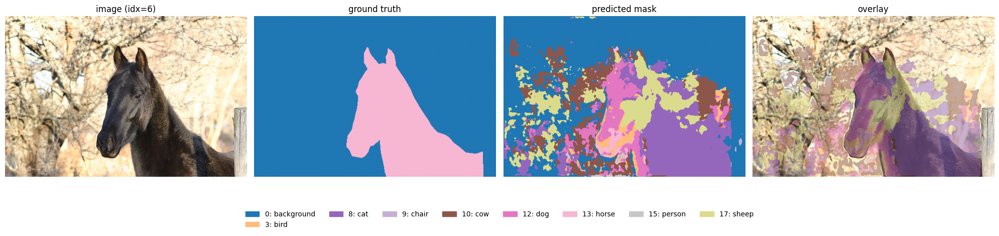

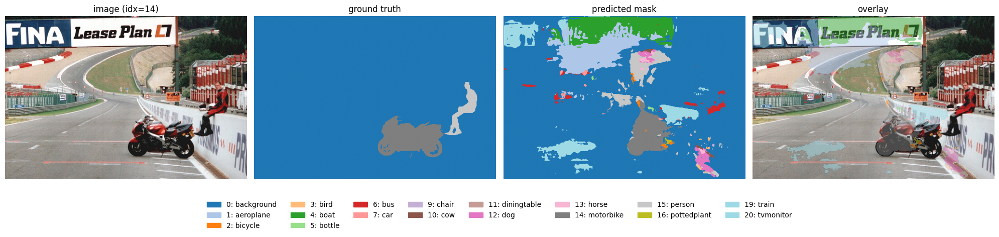

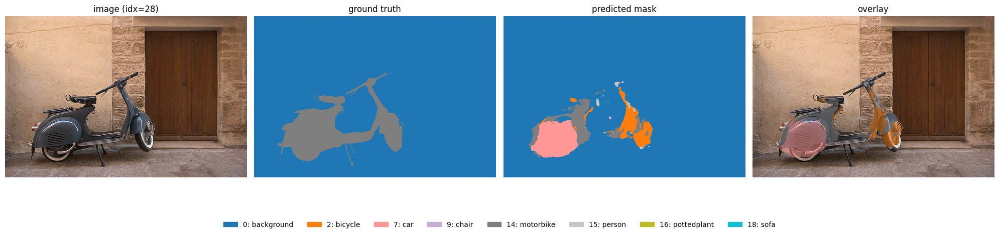

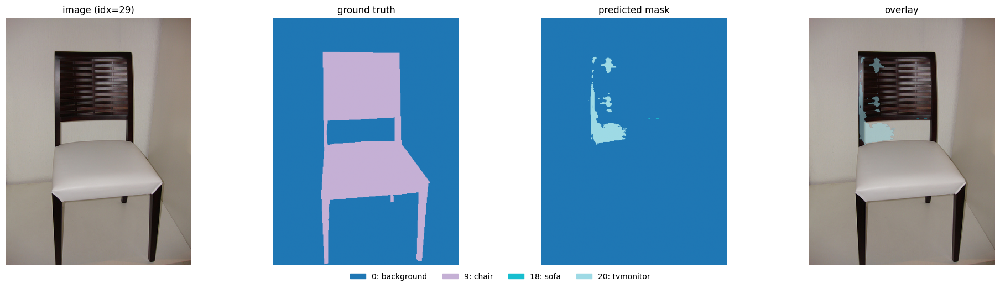

In [30]:

@torch.no_grad()
def visualize_results(index, alpha=0.5, figsize=(20, 5), multiple=16):
    """
    Show: original image | ground truth mask | predicted mask | prediction overlay.
    Includes a legend of the classes present in GT or prediction.
    """
    img_np = train_df["img"].iloc[index]
    gt_mask = train_df["seg"].iloc[index]
    H, W = img_np.shape[:2]

    # Preprocess like validate(): pad to multiple of 16, normalize
    pad_h = (multiple - H % multiple) % multiple
    pad_w = (multiple - W % multiple) % multiple
    x = img_np.astype(np.float32) / 255.0
    x = (x - MEAN) / STD
    x = np.pad(x, ((0, pad_h), (0, pad_w), (0, 0)))
    x = torch.from_numpy(x).permute(2, 0, 1).unsqueeze(0).float().to(DEVICE)

    model.eval()
    pred_mask = model(x)[:, :, :H, :W].argmax(dim=1)[0].cpu().numpy()

    n_classes = 21
    cmap = plt.get_cmap('tab20', n_classes)

    # Overlay: class 0 transparent
    colored = cmap(pred_mask / (n_classes - 1))
    colored[..., 3] = np.where(pred_mask == 0, 0, alpha)

    # Plot
    fig, ax = plt.subplots(1, 4, figsize=figsize)
    ax[0].imshow(img_np);                                   ax[0].set_title(f"image (idx={index})")
    ax[1].imshow(gt_mask,   cmap=cmap, vmin=0, vmax=n_classes - 1); ax[1].set_title("ground truth")
    ax[2].imshow(pred_mask, cmap=cmap, vmin=0, vmax=n_classes - 1); ax[2].set_title("predicted mask")
    ax[3].imshow(img_np); ax[3].imshow(colored);            ax[3].set_title("overlay")
    for a in ax:
        a.axis('off')

    # Build a legend from the classes present in either GT or prediction
    classes_present = sorted(set(np.unique(gt_mask)) | set(np.unique(pred_mask)))
    handles = []
    for c in classes_present:
        try:
            label = f"{c}: {VOC_CLASSES[c]}"
        except (NameError, IndexError):
            label = f"class {c}"
        handles.append(mpatches.Patch(color=cmap(c / (n_classes - 1)), label=label))

    fig.legend(handles=handles, loc='lower center',
               ncol=min(len(handles), 8), bbox_to_anchor=(0.5, -0.05),
               frameon=False, fontsize=10)

    plt.tight_layout()
    plt.show()


visualize_results(val_indices[1])
visualize_results(val_indices[2])
visualize_results(val_indices[3])
visualize_results(val_indices[4])

--manolis end

In [31]:
class RandomSegmentationModel:
    """
    Random segmentation model: 
        - generates random label maps for the inputs based on the class distributions observed during training
        - every pixel in an input can only have one label
    """
    def fit(self, X, Y):
        """
        Adjusts the class ratio variable to the one observed in Y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        Y: list of arrays - n x (height x width)

        Returns
        -------
        self
        """
        self.distribution = np.mean([[np.sum(Y_ == i) / Y_.size for i in range(len(labels) + 1)] for Y_ in Y], axis=0)
        print("Setting class distribution to:\nbackground: {}\n{}".format(self.distribution[0], "\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution[1:]))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label map.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """
        np.random.seed(0)
        return [np.random.choice(np.arange(len(labels) + 1), size=X_.shape[:2], p=self.distribution) for X_ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomSegmentationModel()
model.fit(train_df["img"], train_df["seg"])
test_df.loc[:, "seg"] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
background: 0.7774704888071216
aeroplane: 0.007051912139390122
bicycle: 0.0030340461305405344
bird: 0.009781050583857026
boat: 0.007920222121661963
bottle: 0.00801371700061968
bus: 0.014444057783372053
car: 0.01299203192837253
cat: 0.016639155300546396
chair: 0.008264122763258911
cow: 0.006782009244183503
diningtable: 0.013744445666126768
dog: 0.0074080558785160075
horse: 0.008338953677311486
motorbike: 0.01079509937004467
person: 0.041013621147577735
pottedplant: 0.00539385590505006
sheep: 0.009157332163106574
sofa: 0.00958005931515607
train: 0.012118249521815817
tvmonitor: 0.010057513552370658


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (750,) + inhomogeneous part.

## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [ ]:
generate_submission(test_df)

# 3. Adversarial attack
For this part, your goal is to fool your classification and/or segmentation model, using an *adversarial attack*. More specifically, the goal is build a network to perturb test images in a way that (i) they look unperturbed to humans; but (ii) the original model classifies/segments these images in line with the perturbations.

# 4. Discussion
Finally, take some time to reflect on what you have learned during this assignment. Why did you make certain design choices? How are the models learning and performing? Reflect and produce an overall discussion with links to the lectures and "real world" computer vision.